In [1]:
import numpy as np
import anafibre as fib
from anafibre.plotting import plot_xy_vector_field, add_visible_spectrum, plot_complex_field, animate_fields_xy
from anafibre.utils import pretty_length
import astropy.units as u
import matplotlib.pyplot as plt
from scipy.constants import epsilon_0 as eps0, mu_0 as mu0
import astropy.constants as co
from IPython.display import display, HTML, Latex
plt.rcParams['text.usetex'] = True
from matplotlib.colors import hsv_to_rgb, Normalize, ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable


In [2]:
# Define materials
SiO2  = fib.RefractiveIndexMaterial(shelf='glass', book='fused_silica', page='Malitson')
Si3N4 = fib.RefractiveIndexMaterial(shelf='main', book='Si3N4', page='Luke')
H2O   = fib.RefractiveIndexMaterial(shelf='main', book='H2O', page='Hale')

In [3]:
# Define fibre geometry and materials
fibre = fib.StepIndexFibre(
    core_radius = 250*u.nm, 
    core = SiO2,
    clad = H2O
) 

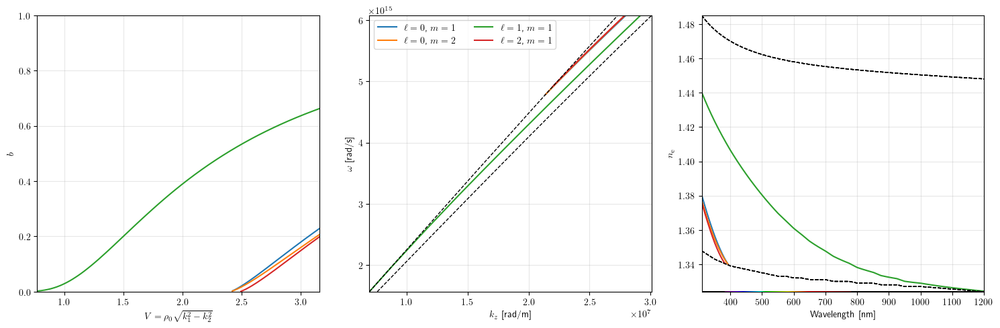

In [4]:
# Set up V grid
# wlgrid = np.linspace(5.504, 0.31, 1000) * u.um  # Wavelength grid from 5.504 μm to 0.31 μm
# wlgrid = np.linspace(fibre.core.rangeMax, fibre.core.rangeMin, 500) * u.um
wlgrid = np.linspace(1.2, fibre.core.rangeMin, 500) * u.um
# wlgrid = np.linspace( 0.48289505, 0.45256148, 500) * u.um

Vgrid = fibre.V(wlgrid)
# Vgrid = Vgrid[np.isfinite(Vgrid)]  # Remove NaN values
# wlgrid = wlgrid[np.isfinite(Vgrid)]  # Remove corresponding wavelengths
# Vgrid = Vgrid.T
k0 = 2 * np.pi / (wlgrid.to(u.m))  # Free space wavenumber
w0 = k0 * co.c  # Angular frequency
# ell_max = fibre.ell_max(Vgrid[-1])
ell_max = fibre.ell_max(wlgrid.T[-1])  # Maximum azimuthal index for the last V value

fig, axs = plt.subplots(figsize=(15, 5),nrows=1, ncols=3)

for ell in range(ell_max + 1):
    m_max = fibre.m_max(ell, wlgrid.T[-1])
    for m in range(1, m_max + 1):
        b = fibre.b(ell=ell, m=m, wavelength=wlgrid)
        kz = fib.dispersion.b_to_kz(fibre, b, wlgrid)
        neff = fib.dispersion.b_to_neff(fibre, b[::-1], wlgrid[::-1])

        axs[0].plot(Vgrid, b, label=fr"$\ell={ell}$, $m={m}$")
        axs[0].set_xlabel(r"$V = \rho_0 \sqrt{k_1^2 - k_2^2}$")
        axs[0].set_ylabel(r"$b$")
        axs[0].set_ylim(0, 1)
        axs[0].set_xlim(Vgrid.min(), Vgrid.max())
        axs[0].grid(True, alpha=0.3)

        # axs[0].legend(ncol=2)

        axs[1].plot(kz, w0, label=fr"$\ell={ell}$, $m={m}$")
        axs[1].set_ylim(w0[0].value, w0[-1].value)
        axs[1].set_xlim(fibre.n_clad(wlgrid[0]) * k0[0].value, fibre.n_core(wlgrid[-1]) * k0[-1].value)
        axs[1].set_ylabel(r"$\omega$ [rad/s]")
        axs[1].set_xlabel(r"$k_z$ [rad/m]")
        axs[1].grid(True, alpha=0.3)
        axs[1].legend(ncol=2)

        axs[2].plot((wlgrid[::-1]).to_value(u.nm), neff, label=fr"$\ell={ell}$, $m={m}$")
        axs[2].set_xlabel(r"Wavelength [nm]")
        axs[2].set_ylabel(r"$n_\mathrm{e}$")
        axs[2].set_ylim(fibre.n_clad(wlgrid[0]), fibre.n_core(wlgrid[-1]))
        axs[2].set_xlim(wlgrid[::-1].to_value(u.nm).min(), wlgrid[::-1].to_value(u.nm).max())
        axs[2].grid(True, alpha=0.3)
        axs[2].plot((wlgrid[::-1]).to_value(u.nm),fibre.n_core(wlgrid[::-1]), 'k--', label='n_core', lw=1)
        axs[2].plot((wlgrid[::-1]).to_value(u.nm),fibre.n_clad(wlgrid[::-1]), 'k--', label='n_clad', lw=1)
        add_visible_spectrum(axs[2],position=[0, 0, 1, 0.0025], wavelengths=wlgrid[::-1].to_value(u.nm))
axs[1].plot(fibre.n_core(wlgrid) * k0, w0, 'k--', label='n_core', lw=1)
axs[1].plot(fibre.n_clad(wlgrid) * k0, w0, 'k--', label='n_clad', lw=1)

plt.tight_layout()
plt.show()

In [5]:
# wl1 = np.linspace(0.31, 1.25, 100) * u.um
# wl2 = np.copy(wl1)
# W1, W2 = np.meshgrid(wl1, wl2, indexing='xy')   # shape (N,N)

# # Choose how to define the third wavelength:
# # Physical (sum-frequency): 1/λ3 = 1/λ1 + 1/λ2
# W3 = 1 / (1/W1 + 1/W2)
# # W3 = np.where(W3.to_value(u.um) > 0.31, W3, np.nan*u.um)  # Set a minimum wavelength to avoid division by zero

# def kz_grid(ell, m, W):
#     flat = fibre.kz(ell=ell, m=m, wavelength=W.ravel())
#     return flat.reshape(W.shape)

# kz1 = fibre.kz(ell=1, m=1, wavelength=wl1)
# kz2 = fibre.kz(ell=1, m=1, wavelength=wl2)
# kz3 = kz_grid(ell=2, m=1, W=W3)

# Delta = kz1[np.newaxis, :] + kz2[:, np.newaxis] - kz3

# # Convert wavelength grids to nm for axes
# W1_nm = W1.to_value(u.nm)
# W2_nm = W2.to_value(u.nm)

# # # Get Delta in 1/m (strip units)
# # Delta = Delta.to_value(1/u.m)

# fig, ax = plt.subplots(figsize=(6,5))

# # Optional background: sign of Delta (red/blue)
# im = ax.contourf(W1_nm, W2_nm, Delta,
#                  levels=51, cmap='RdBu_r',vmin=-np.abs(np.nan_to_num(Delta)).max(), vmax=np.abs(np.nan_to_num(Delta)).max())
# cbar = fig.colorbar(im, ax=ax, shrink=0.85)
# cbar.set_label(r'$\Delta\;[{\rm m^{-1}}]$')

# # Zero contour (phase matching)
# cs = ax.contour(W1_nm, W2_nm, Delta, levels=[0.0],
#                 colors='k', linewidths=2)
# ax.clabel(cs, fmt={0.0: r'$\Delta=0$'}, inline=True, fontsize=9)
# ax.plot(wl1.to_value(u.nm), wl2.to_value(u.nm), 'k--', label=r'$\lambda_1 = \lambda_2$')

# ax.set_xlabel(r'$\lambda_1$ [nm]')
# ax.set_ylabel(r'$\lambda_2$ [nm]')
# ax.set_title(r'Phase matching ($\Delta = k_{z1}+k_{z2}-k_{z3}$)')

# ax.set_aspect('equal')  # optional; remove if you prefer rectangular
# plt.tight_layout()
# plt.show()


In [6]:

# # cs.allsegs is a list (one per contour level) of arrays of (x, y) points
# contour_points = []
# for seg in cs.allsegs[0]:  # index 0 because we only have one level (0.0)
#     wl1_vals = seg[:, 0]
#     wl2_vals = seg[:, 1]
#     contour_points.append((wl1_vals, wl2_vals))
#     target_wl1 = 810
# result_wl2 = []

# for wl1_vals, wl2_vals in contour_points:
#     if wl1_vals.min() <= target_wl1 <= wl1_vals.max():
#         wl2_interp = np.interp(target_wl1, wl1_vals, wl2_vals)
#         result_wl2.append(wl2_interp)

# print(result_wl2)

In [7]:
# Wavelengths
wl1 = 800 * u.nm 
wl2 = 704.8 * u.nm 
wl3=1/(1/wl1+1/wl2)

mode0 = fibre.HE(ell=1, n=1, wl=wl1, a_plus=1, a_minus=0)
mode1 = fibre.HE(ell=1, n=1, wl=wl2, a_plus=1, a_minus=0)
mode2 = fibre.HE(ell=2, n=1, wl=wl3, a_plus=1, a_minus=0)
mode3 = fibre.HE(ell=2, n=1, wl=wl3, a_plus=0, a_minus=1)
fib.display_modes(mode0, mode1, mode2, mode3)

Lc_val = (np.pi / (mode0.kz + mode1.kz - mode2.kz))*u.m
Latex(f"$L_c = {pretty_length(Lc_val)}$")


Mode,λ [nm],V,ne,s1,s2,s3
HE11,IR800.00,1.15,1.3381,0.00,0.00,1.00
HE11,704.80,1.31,1.3471,0.00,0.00,1.00
HE21,UV374.69,2.56,1.3429,0.00,0.00,1.00
HE21,UV374.69,2.56,1.3429,0.00,0.00,-1.00


<IPython.core.display.Latex object>

In [8]:
r = 4 * fibre.core_radius  # Radius in micrometers
Np= 800  # Number of points in each direction
x = np.linspace(-r, r, Np) * u.m
y = np.linspace(-r, r, Np) * u.m
X, Y = np.meshgrid(x, y)
rho = np.sqrt(X**2 + Y**2)
P0 = mode0.Power(x=X, y=Y, z=0)
P1 = mode1.Power(x=X, y=Y, z=0)
P2 = mode2.Power(x=X, y=Y, z=0)

# Compute once
E0 = mode0.E(x=X, y=Y, z=0)/np.sqrt(P0)
E1 = mode1.E(x=X, y=Y, z=0)/np.sqrt(P1)
E2 = mode2.E(x=X, y=Y, z=0)/np.sqrt(P2)
E3 = mode3.E(x=X, y=Y, z=0)/np.sqrt(P2)

In [9]:
# r = 4 * fibre.core_radius  # Radius in micrometers
# Np= 2000  # Number of points in each direction
# rho = np.linspace(0, r, Np) * u.m
# phi = np.linspace(0, 2 * np.pi, Np) 
# Rho, Phi = np.meshgrid(rho, phi)

# X = Rho * np.cos(Phi)
# Y = Rho * np.sin(Phi)

# P0 = mode0.Power(rho=Rho, phi=Phi, z=0)
# P1 = mode1.Power(rho=Rho, phi=Phi, z=0)
# P2 = mode2.Power(rho=Rho, phi=Phi, z=0)

# E0 = mode0.E(rho=Rho, phi=Phi, z=0)/np.sqrt(P0)
# E1 = mode1.E(rho=Rho, phi=Phi, z=0)/np.sqrt(P1)
# E2 = mode2.E(rho=Rho, phi=Phi, z=0)/np.sqrt(P2)
# E3 = mode3.E(rho=Rho, phi=Phi, z=0)/np.sqrt(P2)

In [10]:
anim = animate_fields_xy(modes=[mode0, mode1],weights=[1,1], show=("E",),figsize=(4,4),scale=200)
display(HTML(anim.to_jshtml()))

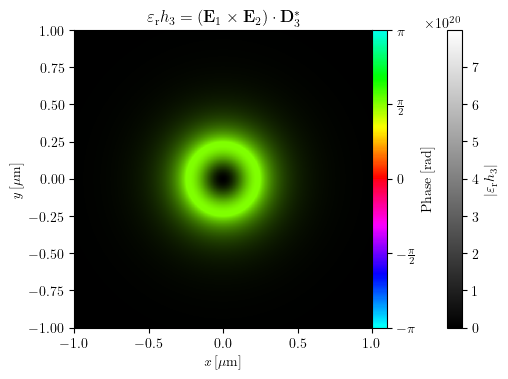

<IPython.core.display.Latex object>

In [11]:
kwargs = dict(
    variant="dark", X=X, Y=Y,
    title=r"$\varepsilon_\mathrm{r} h_3=(\mathbf{E}_1\times\mathbf{E}_2)\cdot\mathbf{D}_3^*$",
    mag_label=r"$|\varepsilon_\mathrm{r} h_3|$",
    use_tex=True   # set True if your system has LaTeX installed
)

cross01 = np.cross(E0, E1)                                  
h3 = np.sum(np.conjugate(E2) * cross01, axis=-1)
h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  
h3_eps = h3 * fibre.eps(rho, wl3)                          

# Dark variant (your current, uncommented look): v = |field|, s = 1
fig, ax, cb_phase, cb_mag = plot_complex_field(h3_eps, **kwargs)
# plt.show()
fig.savefig("h3_phase.pdf", bbox_inches="tight", dpi=600)

dx = X[0, 1] - X[0, 0]                                      # assuming uniform grid
H3 = np.sum(h3_masked * (u.V/u.m)**3 * dx**2)           # area integral (units as appropriate)
display(Latex(r"$H_3 = \iiint\limits_\text{clad}(\mathbf{E}_1\times\mathbf{E}_2)\cdot\mathbf{E}_3^*\,\mathrm{d}V"
              r" = " + H3._repr_latex_()[1:-1] + r" L_\mathrm{eff}$"))
ap=H3

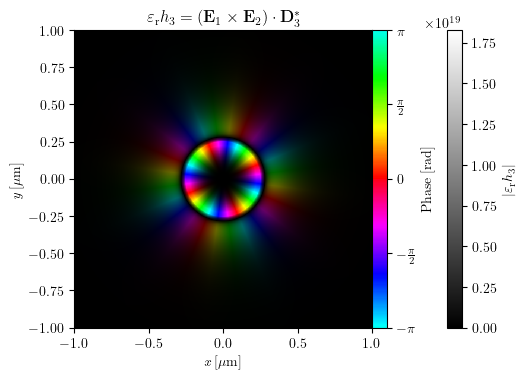

<IPython.core.display.Latex object>

In [12]:
cross01 = np.cross(E0, E1)                                  
h3 = np.sum(np.conjugate(E3) * cross01, axis=-1)
h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  
h3_eps = h3 * fibre.eps(rho, wl3)                          

# Dark variant (your current, uncommented look): v = |field|, s = 1
fig, ax, cb_phase, cb_mag = plot_complex_field(h3_eps, **kwargs)
# plt.show()
fig.savefig("h3_phase.pdf", bbox_inches="tight", dpi=600)

dx = X[0, 1] - X[0, 0]                                      # assuming uniform grid
H3 = np.sum(h3_masked * (u.V/u.m)**3 * dx**2)           # area integral (units as appropriate)
display(Latex(r"$H_3 = \iiint\limits_\text{clad}(\mathbf{E}_1\times\mathbf{E}_2)\cdot\mathbf{E}_3^*\,\mathrm{d}V"
              r" = " + H3._repr_latex_()[1:-1] + r" L_\mathrm{eff}$"))
am=(H3/ap).value
ap=ap.value/ap.value

In [13]:
anim = animate_fields_xy(modes=[mode2, mode3],weights=[ap,am], show=("E",),figsize=(4,4),scale=40)
display(HTML(anim.to_jshtml()))

In [14]:

# rho = np.sqrt(X**2 + Y**2)

# # Make sure components are last axis (Nx, Ny, 3)
# if E0.shape[0] == 3 and E0.ndim == 3:
#     # reorder to (Nx, Ny, 3)
#     E0 = np.moveaxis(E0, 0, -1)
#     E1 = np.moveaxis(E1, 0, -1)
#     E2 = np.moveaxis(E2, 0, -1)

# # Now safe: last axis = vector components
# cross01 = np.cross(E0, E1)                 # (Nx, Ny, 3)
# h3 = np.sum(np.conjugate(E2) * cross01, axis=-1)#*np.sqrt(fibre.eps(rho,wl1))*np.sqrt(fibre.eps(rho,wl2))#*np.sqrt(fibre.eps(rho,wl3))
# h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  # mask small values
# # Plot colormap
# import matplotlib.pyplot as plt
# fig, ax = plt.subplots(figsize=(5,4))
# im = ax.pcolormesh(X.to_value(u.um), Y.to_value(u.um), h3.real*fibre.eps(rho,wl3),
#                    shading='auto', cmap='RdBu_r', vmin=-np.max(np.abs(h3*fibre.eps(rho,wl3))), vmax=np.max(np.abs(h3*fibre.eps(rho,wl3))))
# ax.set_xlabel('x [µm]')
# ax.set_ylabel('y [µm]')
# ax.set_aspect('equal')
# cbar = plt.colorbar(im, ax=ax)
# cbar.set_label(r'$\varepsilon_\mathrm{r}\Re(h_3) [\mathrm{V}^3/\mathrm{m}^3]$')
# ax.set_title(r'$\varepsilon_\mathrm{r}\Re(h_3)=\Re(\mathbf{D}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\sqrt{\varepsilon_1\varepsilon_2\varepsilon_3}\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# plt.tight_layout()
# plt.show()


# dx = X[0, 1] - X[0, 0]  # assuming uniform grid
# H3=np.sum(h3_masked*(u.V/u.m)**3*dx**2/1)  # integral over the area, should be close to 1 for normalized modes
# display(Latex(r"$H_3 = \iiint\limits_\text{clad}\Re[\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)]\mathrm{d}V =" + H3._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))

In [15]:

# fig, ax = plt.subplots(figsize=(5,4))
# im = ax.pcolormesh(X.to_value(u.um), Y.to_value(u.um), h3.imag*fibre.eps(rho,wl3),
#                    shading='auto', cmap='RdBu_r', vmin=-np.max(np.abs(h3*fibre.eps(rho,wl3))), vmax=np.max(np.abs(h3*fibre.eps(rho,wl3))))
# ax.set_xlabel('x [µm]')
# ax.set_ylabel('y [µm]')
# ax.set_aspect('equal')
# cbar = plt.colorbar(im, ax=ax)
# cbar.set_label(r'$\varepsilon_\mathrm{r}\Im(h_3) [\mathrm{V}^3/\mathrm{m}^3]$')
# ax.set_title(r'$\varepsilon_\mathrm{r}\Im(h_3)=\Im(\mathbf{D}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\sqrt{\varepsilon_1\varepsilon_2\varepsilon_3}\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# plt.tight_layout()
# plt.show()


# display(Latex(r"$\Re H_3 = \iiint\limits_\text{clad}\Re[\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)]\mathrm{d}V =" + (H3.real)._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))
# display(Latex(r"$\Im H_3 = \iiint\limits_\text{clad}\Im[\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)]\mathrm{d}V =" + (H3.imag)._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))

In [16]:
# wl1 = np.linspace(0.31, 1.25, 100) * u.um
# wl2 = np.copy(wl1)
# W1, W2 = np.meshgrid(wl1, wl2, indexing='xy')   # shape (N,N)

# Choose how to define the third wavelength:
# Physical (sum-frequency): 1/λ3 = 1/λ1 + 1/λ2
# W3 = 1 / (1/W1 + 1/W2)
# W3 = np.where(W3.to_value(u.um) > 0.31, W3, np.nan*u.um)  # Set a minimum wavelength to avoid division by zero

def kz_grid(ell, m, W):
    flat = fibre.kz(ell=ell, m=m, wavelength=W.ravel())
    return flat.reshape(W.shape)

kz1 = fibre.kz(ell=1, m=1, wavelength=wl1)
kz2 = fibre.kz(ell=1, m=1, wavelength=wl2)
kz3 = kz_grid(ell=0, m=1, W=W3)

Delta = kz1[np.newaxis, :] + kz2[:, np.newaxis] - kz3

# Convert wavelength grids to nm for axes
W1_nm = W1.to_value(u.nm)
W2_nm = W2.to_value(u.nm)

# # Get Delta in 1/m (strip units)
# Delta = Delta.to_value(1/u.m)

fig, ax = plt.subplots(figsize=(6,5))

# Optional background: sign of Delta (red/blue)
im = ax.contourf(W1_nm, W2_nm, Delta,
                 levels=51, cmap='RdBu_r',vmin=-np.abs(np.nan_to_num(Delta)).max(), vmax=np.abs(np.nan_to_num(Delta)).max())
cbar = fig.colorbar(im, ax=ax, shrink=0.85)
cbar.set_label(r'$\Delta\;[{\rm m^{-1}}]$')

# Zero contour (phase matching)
cs = ax.contour(W1_nm, W2_nm, Delta, levels=[0.0],
                colors='k', linewidths=2)
ax.clabel(cs, fmt={0.0: r'$\Delta=0$'}, inline=True, fontsize=9)
ax.plot(wl1.to_value(u.nm), wl2.to_value(u.nm), 'k--', label=r'$\lambda_1 = \lambda_2$')

ax.set_xlabel(r'$\lambda_1$ [nm]')
ax.set_ylabel(r'$\lambda_2$ [nm]')
ax.set_title(r'Phase matching ($\Delta = k_{z1}+k_{z2}-k_{z3}$)')

ax.set_aspect('equal')  # optional; remove if you prefer rectangular
plt.tight_layout()
plt.show()


NameError: name 'W3' is not defined

In [ ]:

# cs.allsegs is a list (one per contour level) of arrays of (x, y) points
contour_points = []
for seg in cs.allsegs[0]:  # index 0 because we only have one level (0.0)
    wl1_vals = seg[:, 0]
    wl2_vals = seg[:, 1]
    contour_points.append((wl1_vals, wl2_vals))
    target_wl1 = 1000
result_wl2 = []

for wl1_vals, wl2_vals in contour_points:
    if wl1_vals.min() <= target_wl1 <= wl1_vals.max():
        wl2_interp = np.interp(target_wl1, wl1_vals, wl2_vals)
        result_wl2.append(wl2_interp)

print(result_wl2)

[np.float64(601.3102246264906)]


In [ ]:
wl1 = 1000 * u.nm 
wl2 = 505.25 * u.nm 
wl3=1/(1/wl1+1/wl2)

mode0 = fib.GuidedMode(
    fibre=fibre,
    ell=1,
    m=1,
    wavelength=wl1,
    mode_type='HE'
)
display(mode0)

mode1 = fib.GuidedMode(
    fibre=fibre,
    ell=-1,
    m=1,
    wavelength=wl2,
    mode_type='HE'
)
display(mode1)

mode2 = fib.GuidedMode(
    fibre=fibre,
    ell=0,
    m=1,
    wavelength=wl3,
    mode_type='TE'
)
display(mode2)
Lc_val = (np.pi / (mode0.kz + mode1.kz - mode2.kz))*u.m
Latex(f"$L_c = {pretty_length(Lc_val)}$")

Mode,ℓ,m,λ [nm],V,ne,s1,s2,s3
HE11,1,1,IR1000.00,0.92,1.3289,0.00,0.00,1.00


Mode,ℓ,m,λ [nm],V,ne,s1,s2,s3
HE-11,-1,1,505.25,1.85,1.3792,0.00,0.00,1.00


Mode,ℓ,m,λ [nm],V,ne,s1,s2,s3
TE01,0,1,UV335.66,2.89,1.3623,1.00,0.00,0.00


<IPython.core.display.Latex object>

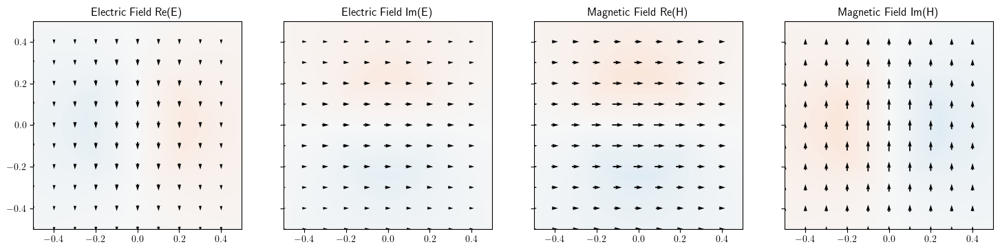

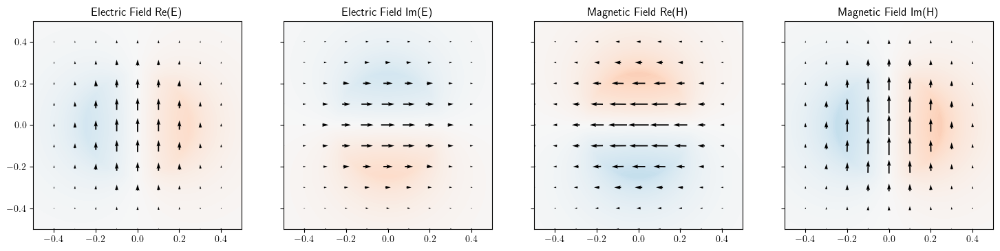

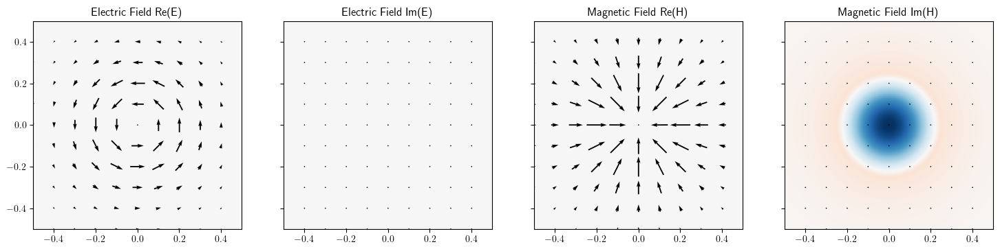

In [ ]:
# from astropy import units as u
# r = 6 * fibre.core_radius  # Radius in micrometers
# Np= 1000  # Number of points in each direction
# x = np.linspace(-r, r, Np) * u.m
# y = np.linspace(-r, r, Np) * u.m
# X, Y = np.meshgrid(x, y)

# Compute once
E0 = mode0.E(x=X, y=Y, z=0)/np.sqrt(mode0.Power(x=X, y=Y, z=0))
E1 = mode1.E(x=X, y=Y, z=0)/np.sqrt(mode1.Power(x=X, y=Y, z=0))
E2 = mode2.E(x=X, y=Y, z=0)/np.sqrt(mode2.Power(x=X, y=Y, z=0))
H0 = mode0.H(x=X, y=Y, z=0)   /np.sqrt(mode0.Power(x=X, y=Y, z=0))
H1 = mode1.H(x=X, y=Y, z=0)   /np.sqrt(mode1.Power(x=X, y=Y, z=0))
H2 = mode2.H(x=X, y=Y, z=0)   /np.sqrt(mode2.Power(x=X, y=Y, z=0))

E = [E0, E1, E2]
H = [H0, H1, H2]

scale=np.max([np.abs(E)*np.sqrt(eps0), np.abs(H)*np.sqrt(mu0)])*10 # Scale for vector field arrows
zscale = np.max(np.array([np.abs(np.array(E)[...,2])*np.sqrt(eps0), np.abs(np.array(H)[...,2])*np.sqrt(mu0)]))


for (E, H) in zip(E, H):
    fig, axes = plt.subplots(1, 4, figsize=(18, 6), sharex=True, sharey=True)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), E.real*np.sqrt(eps0), stride=Np//10, scale=scale, ax=axes[0], zscale=zscale)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), E.imag*np.sqrt(eps0), stride=Np//10, scale=scale, ax=axes[1], zscale=zscale)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), H.real*np.sqrt(mu0), stride=Np//10, scale=scale, ax=axes[2], zscale=zscale)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), H.imag*np.sqrt(mu0), stride=Np//10, scale=scale, ax=axes[3], zscale=zscale)

    axes[0].set_title('Electric Field Re(E)')
    axes[1].set_title('Electric Field Im(E)')
    axes[2].set_title('Magnetic Field Re(H)')
    axes[3].set_title('Magnetic Field Im(H)')

    # plot_xy_vector_field(X.to(u.um), Y.to(u.um), F, stride=Np//10, scale=5e6)
    # plot_xy_vector_field(X, Y, F, type='streamplot',density=.25, linewidth=1)
    plt.show()

In [ ]:
# # plt.rcParams['text.usetex'] = True
# # rho = np.sqrt(X**2 + Y**2)

# # Make sure components are last axis (Nx, Ny, 3)
# if E0.shape[0] == 3 and E0.ndim == 3:
#     # reorder to (Nx, Ny, 3)
#     E0 = np.moveaxis(E0, 0, -1)
#     E1 = np.moveaxis(E1, 0, -1)
#     E2 = np.moveaxis(E2, 0, -1)

# # Now safe: last axis = vector components
# cross01 = np.cross(E0, E1)                 # (Nx, Ny, 3)
# h3 = np.sum(np.conjugate(E2) * cross01, axis=-1)#*np.sqrt(fibre.eps(rho,wl1))*np.sqrt(fibre.eps(rho,wl2))#*np.sqrt(fibre.eps(rho,wl3))
# h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  # mask small values
# # Plot colormap
# import matplotlib.pyplot as plt
# fig, ax = plt.subplots(figsize=(5,4))
# im = ax.pcolormesh(X.to_value(u.um), Y.to_value(u.um), h3.real*fibre.eps(rho,wl3),
#                    shading='auto', cmap='RdBu_r', vmin=-np.max(np.abs(h3*fibre.eps(rho,wl3))), vmax=np.max(np.abs(h3*fibre.eps(rho,wl3))))
# ax.set_xlabel('x [µm]')
# ax.set_ylabel('y [µm]')
# ax.set_aspect('equal')
# cbar = plt.colorbar(im, ax=ax)
# cbar.set_label(r'$\varepsilon_\mathrm{r}\Re(h_3) [\mathrm{V}^3/\mathrm{m}^3]$')
# ax.set_title(r'$\varepsilon_\mathrm{r}\Re(h_3)=\Re(\mathbf{D}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\sqrt{\varepsilon_1\varepsilon_2\varepsilon_3}\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# plt.tight_layout()
# plt.show()



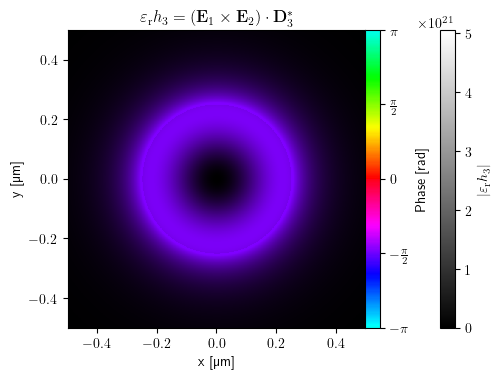

<IPython.core.display.Latex object>

In [ ]:
# --- utils ---
def rolled_cmap(cmap, shift=-0.5):
    """
    Roll a cyclic colormap by 'shift' in [0,1).
    shift=-0.5 puts red at the midpoint (used so the 0 tick is red).
    """
    x = np.linspace(0, 1, 256, endpoint=False)
    return ListedColormap(cmap((x + shift) % 1.0))

# =========================
# Compute h3 and plot
# =========================

# Make sure components are last axis (Nx, Ny, 3)
if E0.shape[0] == 3 and E0.ndim == 3:
    # reorder to (Nx, Ny, 3)
    E0 = np.moveaxis(E0, 0, -1)
    E1 = np.moveaxis(E1, 0, -1)
    E2 = np.moveaxis(E2, 0, -1)

# Now safe: last axis = vector components
cross01 = np.cross(E0, E1)                                  # (Nx, Ny, 3)
h3 = np.sum(np.conjugate(E2) * cross01, axis=-1)
h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  # mask inside core if desired

# --- complex field & scaling ---
h3_eps = h3 * fibre.eps(rho, wl3)                          # full complex field
mag   = np.abs(h3_eps).astype(float)
phase = np.angle(h3_eps)                                    # [-pi, pi]

# Robust brightness scaling (prevents outliers from blowing out the colours)
finite_mag = mag[np.isfinite(mag)]
vmax = np.percentile(finite_mag, 99) if finite_mag.size else 1.0
vmax = float(vmax) if np.isfinite(vmax) and vmax > 0 else 1.0
value = np.clip(mag / vmax, 0, 1)

# --- PHASE → HUE mapping with 0 rad = red ---
# Map phase directly to hue modulo 1 so that 0 → 0 (red), wraps cyclically
hue = np.mod(phase / (2*np.pi), 1.0)

# # Magnitude → saturation (zero ≈ white, large |field| → full colour)
# gamma = 1.0                                                 # <1 boosts weak features, >1 compresses
# s = np.clip(mag / vmax, 0, 1)**gamma
# v = np.ones_like(s)                                         # constant value (brightness)

# Or (sat=1, value=|field|)
s = np.ones_like(hue)
v = value



# Convert HSV → RGB image
rgb = hsv_to_rgb(np.stack([hue, s, v], axis=-1))

# --- plot ---
fig, ax = plt.subplots(figsize=(5, 4), constrained_layout=False)

x = X.to_value(u.um); y = Y.to_value(u.um)                  # assume rectilinear mesh
extent = [x.min(), x.max(), y.min(), y.max()]
ax.imshow(rgb, origin='lower', extent=extent, interpolation='nearest')
ax.set_xlabel("x [µm]"); ax.set_ylabel("y [µm]")
ax.set_aspect('equal')
ax.set_title(r"$\varepsilon_\mathrm{r} h_3=(\mathbf{E}_1\times\mathbf{E}_2)\cdot\mathbf{D}_3^*$")

# --- colourbars (separate mappables) ---
divider = make_axes_locatable(ax)

# Phase bar (−π … π) with red at 0
cax_phase = divider.append_axes("right", size="5%", pad=0.0)
phase_norm = Normalize(vmin=-np.pi, vmax=np.pi)

# Roll HSV so the midpoint (0 rad) is red; ±π (ends) become cyan, matching the image mapping
cmap_phase = rolled_cmap(plt.cm.hsv, shift=-0.5)

sm_phase = plt.cm.ScalarMappable(norm=phase_norm, cmap=cmap_phase)
sm_phase.set_array([])
cb_phase = fig.colorbar(sm_phase, cax=cax_phase)
cb_phase.set_label("Phase [rad]")
cb_phase.set_ticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
cb_phase.set_ticklabels([r"$-\pi$", r"$-\frac{\pi}{2}$", r"$0$", r"$\frac{\pi}{2}$", r"$\pi$"])

# Magnitude bar (0 … vmax) in greyscale, placed a bit further out
cax_mag = divider.append_axes("right", size="5%", pad=0.6)
mag_norm = Normalize(vmin=0.0, vmax=vmax)
sm_mag = plt.cm.ScalarMappable(norm=mag_norm, cmap='gray')
sm_mag.set_array([])
cb_mag = fig.colorbar(sm_mag, cax=cax_mag)
cb_mag.set_label(r"$|\varepsilon_\mathrm{r} h_3|$")
# optional: show the scale factor used for brightness
cb_mag.formatter.set_powerlimits((0, 0))   # scientific as needed
cb_mag.update_ticks()

plt.show()

# --- optional: integral/normalisation diagnostic (as you had) ---
dx = X[0, 1] - X[0, 0]                                      # assuming uniform grid
H3 = np.sum(h3_masked * (u.V/u.m)**3 * dx**2 / 1)           # area integral (units as appropriate)
display(Latex(r"$H_3 = \iiint\limits_\text{clad}\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)\,\mathrm{d}V"
              r" = " + H3._repr_latex_()[1:-1] + r" L_\mathrm{eff}$"))

In [ ]:
# # --- compute complex field ---
# h3_eps = h3 * fibre.eps(rho, wl3)          # full complex field
# mag   = np.abs(h3_eps).astype(float)
# phase = np.angle(h3_eps)                   # [-pi, pi]

# # Robust brightness scaling
# finite_mag = mag[np.isfinite(mag)]
# vmax = np.percentile(finite_mag, 99) if finite_mag.size else 1.0
# vmax = float(vmax) if np.isfinite(vmax) and vmax > 0 else 1.0
# value = np.clip(mag / vmax, 0, 1)

# # --- magnitude -> saturation (zero white, max full colour) ---
# gamma = 1  # tweak: <1 boosts weak features, >1 suppresses them
# s = np.clip(mag / vmax, 0, 1)**gamma        # saturation ∝ |field|
# v = np.ones_like(s)                          # constant brightness (white at zero)


# hue = (phase + np.pi) / (2*np.pi)            # [-pi,pi] → [0,1]
# rgb = hsv_to_rgb(np.stack([hue, s, v], axis=-1))

# # --- plot ---
# fig, ax = plt.subplots(figsize=(5, 4), constrained_layout=False)

# x = X.to_value(u.um); y = Y.to_value(u.um)  # assume rectilinear mesh
# extent = [x.min(), x.max(), y.min(), y.max()]
# ax.imshow(rgb, origin='lower', extent=extent, interpolation='nearest')
# ax.set_xlabel("x [µm]"); ax.set_ylabel("y [µm]")
# ax.set_aspect('equal')
# ax.set_title(r"$\varepsilon_\mathrm{r} h_3=(\mathbf{E}_1\times\mathbf{E}_2)\cdot\mathbf{D}_3^*$")

# # --- colourbars (separate mappables) ---
# divider = make_axes_locatable(ax)

# # Phase bar (−π … π) using HSV
# cax_phase = divider.append_axes("right", size="5%", pad=0.0)
# phase_norm = Normalize(vmin=-np.pi, vmax=np.pi)
# sm_phase = plt.cm.ScalarMappable(norm=phase_norm, cmap=plt.cm.hsv)
# sm_phase.set_array([])
# cb_phase = fig.colorbar(sm_phase, cax=cax_phase)
# cb_phase.set_label("Phase [rad]")
# cb_phase.set_ticks([-np.pi, 0, np.pi])
# cb_phase.set_ticklabels([r"$-\pi$", r"$0$", r"$\pi$"])

# plt.show()

# dx = X[0, 1] - X[0, 0]  # assuming uniform grid
# H3=np.sum(h3_masked*(u.V/u.m)**3*dx**2/1)  # integral over the area, should be close to 1 for normalized modes
# display(Latex(r"$H_3 = \iiint\limits_\text{clad}\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)\mathrm{d}V =" + H3._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))

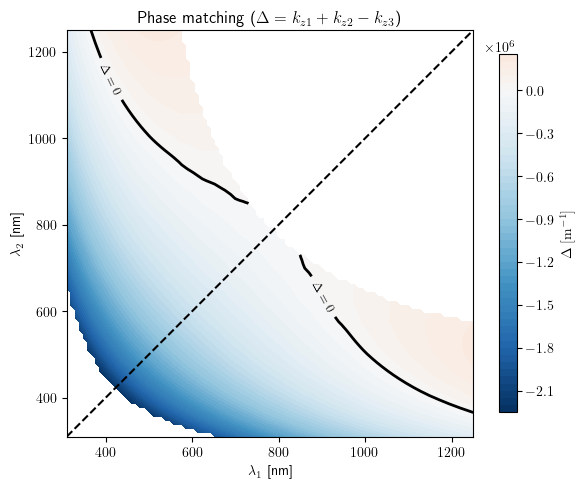

In [ ]:
wl1 = np.linspace(0.31, 1.25, 100) * u.um
wl2 = np.copy(wl1)
W1, W2 = np.meshgrid(wl1, wl2, indexing='xy')   # shape (N,N)

# # Choose how to define the third wavelength:
# # Physical (sum-frequency): 1/λ3 = 1/λ1 + 1/λ2
W3 = 1 / (1/W1 + 1/W2)
# # W3 = np.where(W3.to_value(u.um) > 0.31, W3, np.nan*u.um)  # Set a minimum wavelength to avoid division by zero

# def kz_grid(ell, m, W):
#     flat = fibre.kz(ell=ell, m=m, wavelength=W.ravel())
#     return flat.reshape(W.shape)

kz1 = fibre.kz(ell=1, m=1, wavelength=wl1)
kz2 = fibre.kz(ell=-1, m=1, wavelength=wl2)
kz3 = kz_grid(ell=0, m=2, W=W3)

Delta = kz1[np.newaxis, :] + kz2[:, np.newaxis] - kz3

# Convert wavelength grids to nm for axes
W1_nm = W1.to_value(u.nm)
W2_nm = W2.to_value(u.nm)

# # Get Delta in 1/m (strip units)
# Delta = Delta.to_value(1/u.m)

fig, ax = plt.subplots(figsize=(6,5))

# Optional background: sign of Delta (red/blue)
im = ax.contourf(W1_nm, W2_nm, Delta,
                 levels=51, cmap='RdBu_r',vmin=-np.abs(np.nan_to_num(Delta)).max(), vmax=np.abs(np.nan_to_num(Delta)).max())
cbar = fig.colorbar(im, ax=ax, shrink=0.85)
cbar.set_label(r'$\Delta\;[{\rm m^{-1}}]$')

# Zero contour (phase matching)
cs = ax.contour(W1_nm, W2_nm, Delta, levels=[0.0],
                colors='k', linewidths=2)
ax.clabel(cs, fmt={0.0: r'$\Delta=0$'}, inline=True, fontsize=9)
ax.plot(wl1.to_value(u.nm), wl2.to_value(u.nm), 'k--', label=r'$\lambda_1 = \lambda_2$')

ax.set_xlabel(r'$\lambda_1$ [nm]')
ax.set_ylabel(r'$\lambda_2$ [nm]')
ax.set_title(r'Phase matching ($\Delta = k_{z1}+k_{z2}-k_{z3}$)')

ax.set_aspect('equal')  # optional; remove if you prefer rectangular
plt.tight_layout()
plt.show()


In [ ]:
W3.min()

<Quantity 0.155 um>

In [ ]:

# cs.allsegs is a list (one per contour level) of arrays of (x, y) points
contour_points = []
for seg in cs.allsegs[0]:  # index 0 because we only have one level (0.0)
    wl1_vals = seg[:, 0]
    wl2_vals = seg[:, 1]
    contour_points.append((wl1_vals, wl2_vals))
    target_wl1 = 1000
result_wl2 = []

for wl1_vals, wl2_vals in contour_points:
    if wl1_vals.min() <= target_wl1 <= wl1_vals.max():
        wl2_interp = np.interp(target_wl1, wl1_vals, wl2_vals)
        result_wl2.append(wl2_interp)

print(result_wl2)

[np.float64(505.49882069737174)]


In [ ]:
wl1 = 1000 * u.nm 
wl2 = 538 * u.nm 
# wl2 = 390 * u.nm
wl3=1/(1/wl1+1/wl2)

mode0 = fib.GuidedMode(
    fibre=fibre,
    ell=1,
    m=1,
    wavelength=wl1,
    mode_type='HE'
)
display(mode0)

mode1 = fib.GuidedMode(
    fibre=fibre,
    ell=-1,
    m=1,
    wavelength=wl2,
    mode_type='He'
)
display(mode1)

mode2 = fib.GuidedMode(
    fibre=fibre,
    ell=0,
    m=1,
    wavelength=wl3,
    mode_type='TM'
)
display(mode2)
Lc_val = (np.pi / (mode0.kz + mode1.kz - mode2.kz))*u.m
Latex(f"$L_c = {pretty_length(Lc_val)}$")

Mode,ℓ,m,λ [nm],V,ne,s1,s2,s3
HE11,1,1,IR1000.00,0.92,1.3289,0.00,0.00,1.00


Mode,ℓ,m,λ [nm],V,ne,s1,s2,s3
HE-11,-1,1,538.00,1.74,1.3722,0.00,0.00,1.00


Mode,ℓ,m,λ [nm],V,ne,s1,s2,s3
TM01,0,1,UV349.80,2.76,1.3571,1.00,0.00,0.00


<IPython.core.display.Latex object>

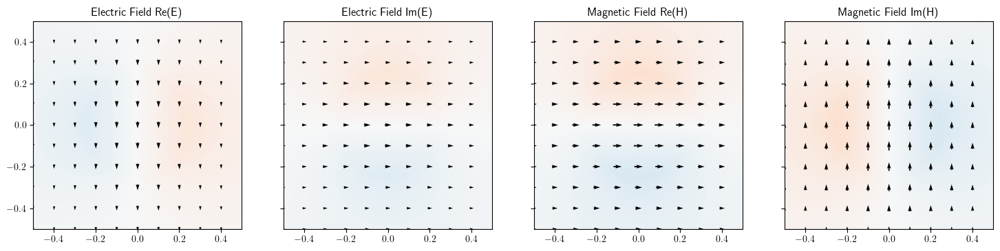

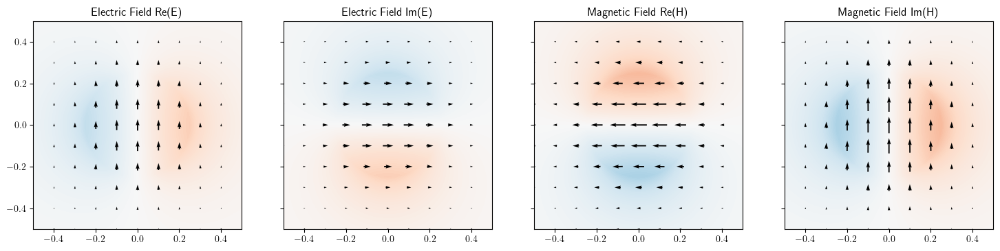

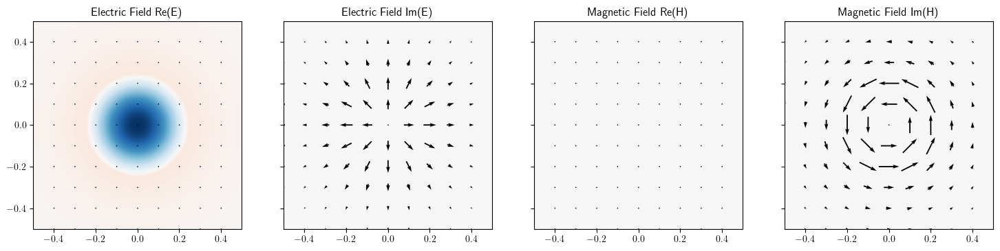

In [ ]:
# from astropy import units as u
# r = 6 * fibre.core_radius  # Radius in micrometers
# Np= 1000  # Number of points in each direction
# x = np.linspace(-r, r, Np) * u.m
# y = np.linspace(-r, r, Np) * u.m
# X, Y = np.meshgrid(x, y)

# Compute once
E0 = mode0.E(x=X, y=Y, z=0)/np.sqrt(mode0.Power(x=X, y=Y, z=0))
E1 = mode1.E(x=X, y=Y, z=0)/np.sqrt(mode1.Power(x=X, y=Y, z=0))
E2 = mode2.E(x=X, y=Y, z=0)/np.sqrt(mode2.Power(x=X, y=Y, z=0))
H0 = mode0.H(x=X, y=Y, z=0)   /np.sqrt(mode0.Power(x=X, y=Y, z=0))
H1 = mode1.H(x=X, y=Y, z=0)   /np.sqrt(mode1.Power(x=X, y=Y, z=0))
H2 = mode2.H(x=X, y=Y, z=0)   /np.sqrt(mode2.Power(x=X, y=Y, z=0))

E = [E0, E1, E2]
H = [H0, H1, H2]

scale=np.max([np.abs(E)*np.sqrt(eps0), np.abs(H)*np.sqrt(mu0)])*10 # Scale for vector field arrows
zscale = np.max(np.array([np.abs(np.array(E)[...,2])*np.sqrt(eps0), np.abs(np.array(H)[...,2])*np.sqrt(mu0)]))


for (E, H) in zip(E, H):
    fig, axes = plt.subplots(1, 4, figsize=(18, 6), sharex=True, sharey=True)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), E.real*np.sqrt(eps0), stride=Np//10, scale=scale, ax=axes[0], zscale=zscale)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), E.imag*np.sqrt(eps0), stride=Np//10, scale=scale, ax=axes[1], zscale=zscale)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), H.real*np.sqrt(mu0), stride=Np//10, scale=scale, ax=axes[2], zscale=zscale)
    plot_xy_vector_field(X.to(u.um), Y.to(u.um), H.imag*np.sqrt(mu0), stride=Np//10, scale=scale, ax=axes[3], zscale=zscale)

    axes[0].set_title('Electric Field Re(E)')
    axes[1].set_title('Electric Field Im(E)')
    axes[2].set_title('Magnetic Field Re(H)')
    axes[3].set_title('Magnetic Field Im(H)')

    # plot_xy_vector_field(X.to(u.um), Y.to(u.um), F, stride=Np//10, scale=5e6)
    # plot_xy_vector_field(X, Y, F, type='streamplot',density=.25, linewidth=1)
    plt.show()

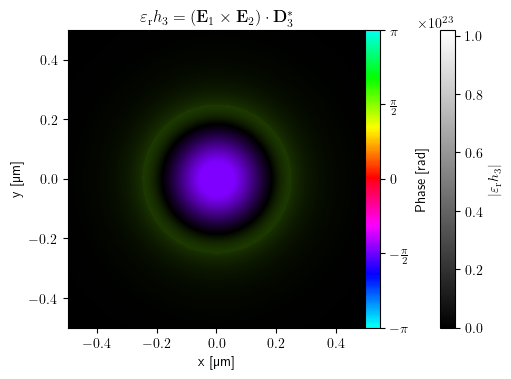

<IPython.core.display.Latex object>

In [ ]:
# --- utils ---
def rolled_cmap(cmap, shift=-0.5):
    """
    Roll a cyclic colormap by 'shift' in [0,1).
    shift=-0.5 puts red at the midpoint (used so the 0 tick is red).
    """
    x = np.linspace(0, 1, 256, endpoint=False)
    return ListedColormap(cmap((x + shift) % 1.0))

# =========================
# Compute h3 and plot
# =========================

# Make sure components are last axis (Nx, Ny, 3)
if E0.shape[0] == 3 and E0.ndim == 3:
    # reorder to (Nx, Ny, 3)
    E0 = np.moveaxis(E0, 0, -1)
    E1 = np.moveaxis(E1, 0, -1)
    E2 = np.moveaxis(E2, 0, -1)

# Now safe: last axis = vector components
cross01 = np.cross(E0, E1)                                  # (Nx, Ny, 3)
h3 = np.sum(np.conjugate(E2) * cross01, axis=-1)
h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  # mask inside core if desired

# --- complex field & scaling ---
h3_eps = h3 * fibre.eps(rho, wl3)                          # full complex field
mag   = np.abs(h3_eps).astype(float)
phase = np.angle(h3_eps)                                    # [-pi, pi]

# Robust brightness scaling (prevents outliers from blowing out the colours)
finite_mag = mag[np.isfinite(mag)]
vmax = np.percentile(finite_mag, 99) if finite_mag.size else 1.0
vmax = float(vmax) if np.isfinite(vmax) and vmax > 0 else 1.0
value = np.clip(mag / vmax, 0, 1)

# --- PHASE → HUE mapping with 0 rad = red ---
# Map phase directly to hue modulo 1 so that 0 → 0 (red), wraps cyclically
hue = np.mod(phase / (2*np.pi), 1.0)

# # Magnitude → saturation (zero ≈ white, large |field| → full colour)
# gamma = 1.0                                                 # <1 boosts weak features, >1 compresses
# s = np.clip(mag / vmax, 0, 1)**gamma
# v = np.ones_like(s)                                         # constant value (brightness)

# Or (sat=1, value=|field|)
s = np.ones_like(hue)
v = value



# Convert HSV → RGB image
rgb = hsv_to_rgb(np.stack([hue, s, v], axis=-1))

# --- plot ---
fig, ax = plt.subplots(figsize=(5, 4), constrained_layout=False)

x = X.to_value(u.um); y = Y.to_value(u.um)                  # assume rectilinear mesh
extent = [x.min(), x.max(), y.min(), y.max()]
ax.imshow(rgb, origin='lower', extent=extent, interpolation='nearest')
ax.set_xlabel("x [µm]"); ax.set_ylabel("y [µm]")
ax.set_aspect('equal')
ax.set_title(r"$\varepsilon_\mathrm{r} h_3=(\mathbf{E}_1\times\mathbf{E}_2)\cdot\mathbf{D}_3^*$")

# --- colourbars (separate mappables) ---
divider = make_axes_locatable(ax)

# Phase bar (−π … π) with red at 0
cax_phase = divider.append_axes("right", size="5%", pad=0.0)
phase_norm = Normalize(vmin=-np.pi, vmax=np.pi)

# Roll HSV so the midpoint (0 rad) is red; ±π (ends) become cyan, matching the image mapping
cmap_phase = rolled_cmap(plt.cm.hsv, shift=-0.5)

sm_phase = plt.cm.ScalarMappable(norm=phase_norm, cmap=cmap_phase)
sm_phase.set_array([])
cb_phase = fig.colorbar(sm_phase, cax=cax_phase)
cb_phase.set_label("Phase [rad]")
cb_phase.set_ticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
cb_phase.set_ticklabels([r"$-\pi$", r"$-\frac{\pi}{2}$", r"$0$", r"$\frac{\pi}{2}$", r"$\pi$"])

# Magnitude bar (0 … vmax) in greyscale, placed a bit further out
cax_mag = divider.append_axes("right", size="5%", pad=0.6)
mag_norm = Normalize(vmin=0.0, vmax=vmax)
sm_mag = plt.cm.ScalarMappable(norm=mag_norm, cmap='gray')
sm_mag.set_array([])
cb_mag = fig.colorbar(sm_mag, cax=cax_mag)
cb_mag.set_label(r"$|\varepsilon_\mathrm{r} h_3|$")
# optional: show the scale factor used for brightness
cb_mag.formatter.set_powerlimits((0, 0))   # scientific as needed
cb_mag.update_ticks()

plt.show()

# --- optional: integral/normalisation diagnostic (as you had) ---
dx = X[0, 1] - X[0, 0]                                      # assuming uniform grid
H3 = np.sum(h3_masked * (u.V/u.m)**3 * dx**2 / 1)           # area integral (units as appropriate)
display(Latex(r"$H_3 = \iiint\limits_\text{clad}\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)\,\mathrm{d}V"
              r" = " + H3._repr_latex_()[1:-1] + r" L_\mathrm{eff}$"))

In [ ]:

# # rho = np.sqrt(X**2 + Y**2)

# # Make sure components are last axis (Nx, Ny, 3)
# if E0.shape[0] == 3 and E0.ndim == 3:
#     # reorder to (Nx, Ny, 3)
#     E0 = np.moveaxis(E0, 0, -1)
#     E1 = np.moveaxis(E1, 0, -1)
#     E2 = np.moveaxis(E2, 0, -1)

# # Now safe: last axis = vector components
# cross01 = np.cross(E0, E1)                 # (Nx, Ny, 3)
# h3 = np.sum(np.conjugate(E2) * cross01, axis=-1)#*np.sqrt(fibre.eps(rho,wl1))*np.sqrt(fibre.eps(rho,wl2))#*np.sqrt(fibre.eps(rho,wl3))
# h3_masked = np.ma.masked_where(rho.value < fibre.core_radius, h3)  # mask small values
# # Plot colormap
# import matplotlib.pyplot as plt
# fig, ax = plt.subplots(figsize=(5,4))
# im = ax.pcolormesh(X.to_value(u.um), Y.to_value(u.um), h3.real*fibre.eps(rho,wl3),
#                    shading='auto', cmap='RdBu_r', vmin=-np.max(np.abs(h3*fibre.eps(rho,wl3))), vmax=np.max(np.abs(h3*fibre.eps(rho,wl3))))
# ax.set_xlabel('x [µm]')
# ax.set_ylabel('y [µm]')
# ax.set_aspect('equal')
# cbar = plt.colorbar(im, ax=ax)
# cbar.set_label(r'$\varepsilon_\mathrm{r}\Re(h_3) [\mathrm{V}^3/\mathrm{m}^3]$')
# ax.set_title(r'$\varepsilon_\mathrm{r}\Re(h_3)=\Re(\mathbf{D}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\sqrt{\varepsilon_1\varepsilon_2\varepsilon_3}\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# plt.tight_layout()
# plt.show()


# dx = X[0, 1] - X[0, 0]  # assuming uniform grid
# H3=np.sum(h3_masked*(u.V/u.m)**3*dx**2/1)  # integral over the area, should be close to 1 for normalized modes
# display(Latex(r"$H_3 = \iiint\limits_\text{clad}\Re[\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)]\mathrm{d}V =" + H3._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))

In [ ]:

# fig, ax = plt.subplots(figsize=(5,4))
# im = ax.pcolormesh(X.to_value(u.um), Y.to_value(u.um), h3.imag*fibre.eps(rho,wl3),
#                    shading='auto', cmap='RdBu_r', vmin=-np.max(np.abs(h3*fibre.eps(rho,wl3))), vmax=np.max(np.abs(h3*fibre.eps(rho,wl3))))
# ax.set_xlabel('x [µm]')
# ax.set_ylabel('y [µm]')
# ax.set_aspect('equal')
# cbar = plt.colorbar(im, ax=ax)
# cbar.set_label(r'$\varepsilon_\mathrm{r}\Im(h_3) [\mathrm{V}^3/\mathrm{m}^3]$')
# ax.set_title(r'$\varepsilon_\mathrm{r}\Im(h_3)=\Im(\mathbf{D}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\sqrt{\varepsilon_1\varepsilon_2\varepsilon_3}\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# # ax.set_title(r'$\Re(h_3)=\Re(\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2))$')
# plt.tight_layout()
# plt.show()


# display(Latex(r"$\Re H_3 = \iiint\limits_\text{clad}\Re[\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)]\mathrm{d}V =" + (H3.real)._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))
# display(Latex(r"$\Im H_3 = \iiint\limits_\text{clad}\Im[\mathbf{E}_3^*\cdot(\mathbf{E}_1\times\mathbf{E}_2)]\mathrm{d}V =" + (H3.imag)._repr_latex_()[1:-1] + r"L_\mathrm{eff}$"))